<a href="https://colab.research.google.com/github/smcri/ML_dataset/blob/main/waifu_chan_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import (Dense, 
                                     BatchNormalization, 
                                     LeakyReLU, 
                                     Reshape, 
                                     Conv2DTranspose,
                                     Conv2D,
                                     Dropout,
                                     Flatten)
import matplotlib.pyplot as plt
import glob
import numpy as np
import imageio
import cv2
import io
from google.colab import drive
from google.colab.patches import cv2_imshow
from matplotlib.figure import Figure

In [ ]:
! pip install kaggle                                                                      #install kaggle
! mkdir ~/.kaggle                                                                         #make .kaggle directory at current position
!wget https://raw.githubusercontent.com/smcri/ML_dataset/main/kaggle.json                 #import account api key
! cp kaggle.json ~/.kaggle/                                                               #copy account api key into folder
! chmod 600 ~/.kaggle/kaggle.json                                                         #give rwx permissions

! kaggle datasets download splcher/animefacedataset       #use kaggle module to download csv dataset from kaggle     


! unzip animefacedataset.zip                                                      #unzip received zip files

Streaming output truncated to the last 5000 lines.
  inflating: images/62764_2019.jpg   
  inflating: images/62765_2019.jpg   
  inflating: images/62766_2019.jpg   
  inflating: images/62767_2019.jpg   
  inflating: images/62768_2019.jpg   
  inflating: images/62769_2019.jpg   
  inflating: images/6276_2003.jpg    
  inflating: images/62770_2019.jpg   
  inflating: images/62771_2019.jpg   
  inflating: images/62772_2019.jpg   
  inflating: images/62773_2019.jpg   
  inflating: images/62774_2019.jpg   
  inflating: images/62775_2019.jpg   
  inflating: images/62776_2019.jpg   
  inflating: images/62777_2019.jpg   
  inflating: images/62778_2019.jpg   
  inflating: images/62779_2019.jpg   
  inflating: images/6277_2003.jpg    
  inflating: images/62780_2019.jpg   
  inflating: images/62781_2019.jpg   
  inflating: images/62782_2019.jpg   
  inflating: images/62783_2019.jpg   
  inflating: images/62784_2019.jpg   
  inflating: images/62785_2019.jpg   
  inflating: images/62786_2019.jpg   

In [3]:
path = "images/"
image_files = [f for f in glob.glob(path + "*.jpg", recursive=False)]

In [4]:
def read_image(image_file):
    image_string = tf.io.read_file(image_file)
    image_decoded = tf.image.decode_jpeg(image_string) # to array
    image_resize = tf.image.resize(image_decoded, [28, 28])
    return image_resize / 255 # resize

In [5]:
X_train = []
for path in image_files:
    X_train.append(read_image(path))

In [6]:
class GAN:
    def __init__(self, X= None, batch_size= 32, epochs= 10, optimizer= tf.keras.optimizers.Adam(0.01), noise_dim = 30):
        super(GAN, self).__init__()
        self.batch_size = batch_size
        self.epochs = epochs
        self.optimizer = optimizer
        self.noise_dim = noise_dim
        self.generator = None
        self.discriminator = None
        self.gan = None
        self.dataset = tf.data.Dataset.from_tensor_slices(X).shuffle(1000)
        self.dataset= self.dataset.batch(self.batch_size).prefetch(1)
    
    @staticmethod
    def plot_multiple_images(images, n_cols=None,epoch = True,i = 0):
        n_cols = n_cols or len(images)
        n_rows = (len(images) - 1) // n_cols + 1
        if images.shape[-1] == 1:
            images = np.squeeze(images, axis=-1)
        fig = plt.figure(figsize=(n_cols, n_rows))
        for index, image in enumerate(images):
            plt.subplot(n_rows, n_cols, index + 1)
            image = np.clip(image, 0, 1)
            plt.imshow(image, cmap="magma")
            plt.axis("off")

        plt.show()
    
    def build(self):
        pass
    
    def generate(self, num_examples= None):
        num_examples= self.batch_size if num_examples is None else num_examples
        z = tf.random.normal(shape=[num_examples, self.noise_dim])
        X_gen = self.generator(z)
        return X_gen
    
    def train(self):
        batch_per_epoch = tf.data.experimental.cardinality(self.dataset).numpy()
        self.history = {'disc-loss': [], 'gen-loss': []}
        i = 0
        for epoch in range(self.epochs):   
            i = i + 1
            d_losses = []
            g_losses = []
            progress_bar_train = tf.keras.utils.Progbar(batch_per_epoch)
            for batch, X_batch in zip(range(batch_per_epoch), self.dataset):
                # phase 1 - training the discriminator
                z = tf.random.normal(shape=[X_batch.shape[0], self.noise_dim])
                X_gen = self.generator(z)
                X_fake_and_real = tf.concat([X_gen, X_batch], axis=0)
                y1 = tf.constant([[0.]] * X_batch.shape[0] + [[1.]] * X_batch.shape[0])
                self.discriminator.trainable = True
                d_loss_batch = self.discriminator.train_on_batch(X_fake_and_real, y1)
                d_losses.append(d_loss_batch)
                # phase 2 - training the generator
                z = tf.random.normal(shape=[self.batch_size, self.noise_dim])
                y2 = tf.constant([[1.]] * self.batch_size)
                self.discriminator.trainable = False
                g_loss_batch= self.gan.train_on_batch(z, y2)
                g_losses.append(g_loss_batch)
                #GAN.plot_multiple_images(self.generate(), 8,False,i)
                if(batch % 25 ==0):
                    progress_bar_train.add(25, values=[('d loss', d_loss_batch), ('g loss', g_loss_batch)])
            print("Epoch {}/{}: disc-loss = {}, gen-loss = {}".format(epoch + 1, self.epochs, np.mean(d_losses), np.mean(g_losses))) 
            self.history['disc-loss'].append(np.mean(d_losses))
            self.history['gen-loss'].append(np.mean(g_losses))
            GAN.plot_multiple_images(self.generate(), 8,True,i)

In [7]:
class StandardGAN(GAN):
    def __init__(self, X= None, batch_size= 32, epochs= 10, optimizer= tf.keras.optimizers.Adam(0.01), noise_dim = 30):
        super(StandardGAN, self).__init__(X, batch_size, epochs, optimizer, noise_dim)
    
    def build(self):
        self.generator = keras.models.Sequential([
            keras.layers.Dense(100, activation="selu", input_shape=[self.noise_dim]),
            keras.layers.Dense(150, activation="selu"),
            keras.layers.Dense(28 * 28 * 3, activation="sigmoid"),
            keras.layers.Reshape([28, 28, 3])])
        
        self.discriminator = keras.models.Sequential([
            keras.layers.Flatten(input_shape=[28, 28, 3]),
            keras.layers.Dense(150, activation="selu"),
            keras.layers.Dense(100, activation="selu"),
            keras.layers.Dense(1, activation="sigmoid")])
        self.gan = keras.models.Sequential([self.generator, self.discriminator])
        
        self.discriminator.compile(loss="binary_crossentropy", optimizer= self.optimizer)
        self.discriminator.trainable = False
        self.gan.compile(loss="binary_crossentropy", optimizer= self.optimizer)

In [8]:
standard_GAN = StandardGAN(X= X_train, noise_dim=100, optimizer= tf.keras.optimizers.RMSprop(), epochs= 20)

In [9]:
standard_GAN.build()

2000/1987 [==============================] - 70s 35ms/step - d loss: 0.7320 - g loss: 0.7875
Epoch 1/20: disc-loss = 0.7485248560154324, gen-loss = 0.7937386164485467


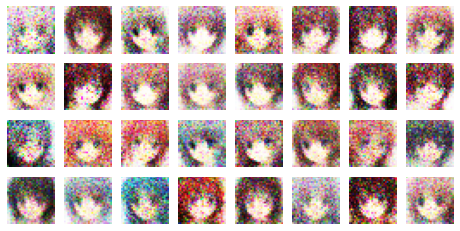

2000/1987 [==============================] - 64s 32ms/step - d loss: 0.7160 - g loss: 0.7180
Epoch 2/20: disc-loss = 0.7014348078266004, gen-loss = 0.7103209258190759


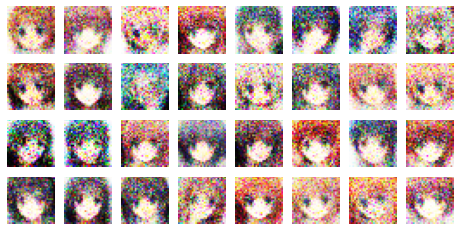

2000/1987 [==============================] - 64s 32ms/step - d loss: 0.7007 - g loss: 0.7096
Epoch 3/20: disc-loss = 0.6988908287923301, gen-loss = 0.7041056754454693


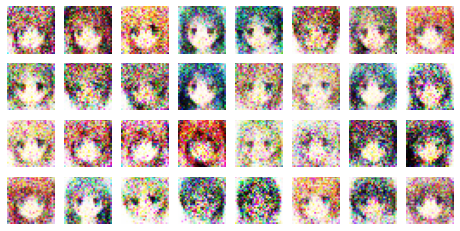

2000/1987 [==============================] - 67s 34ms/step - d loss: 0.7010 - g loss: 0.7046
Epoch 4/20: disc-loss = 0.6985629284927818, gen-loss = 0.7025013926659749


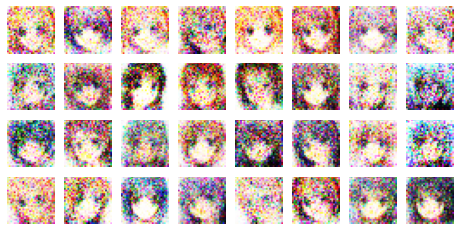

2000/1987 [==============================] - 69s 34ms/step - d loss: 0.7043 - g loss: 0.6880
Epoch 5/20: disc-loss = 0.6996128199744837, gen-loss = 0.7038630926105085


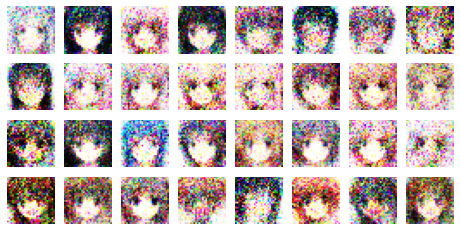

2000/1987 [==============================] - 67s 33ms/step - d loss: 0.6960 - g loss: 0.6938
Epoch 6/20: disc-loss = 0.6966058363192155, gen-loss = 0.6986871809142285


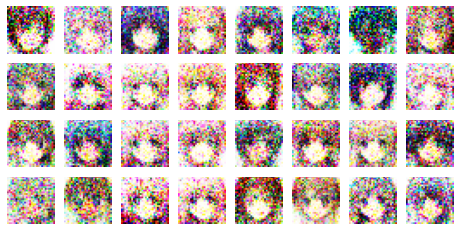

2000/1987 [==============================] - 65s 33ms/step - d loss: 0.6976 - g loss: 0.6819
Epoch 7/20: disc-loss = 0.6966827871155127, gen-loss = 0.6991555811579526


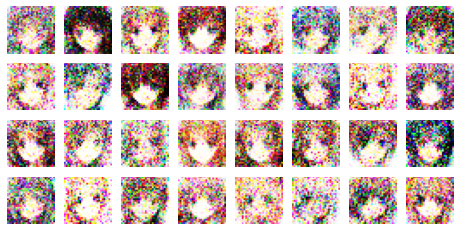

2000/1987 [==============================] - 67s 33ms/step - d loss: 0.6956 - g loss: 0.6961
Epoch 8/20: disc-loss = 0.6955673083865469, gen-loss = 0.6975136292778672


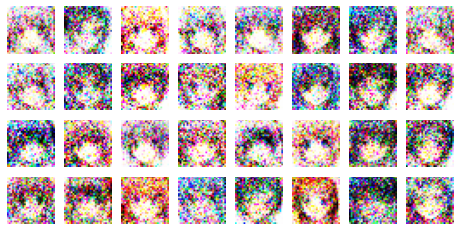

2000/1987 [==============================] - 68s 34ms/step - d loss: 0.6952 - g loss: 0.6876
Epoch 9/20: disc-loss = 0.695492750475259, gen-loss = 0.6977289396131464


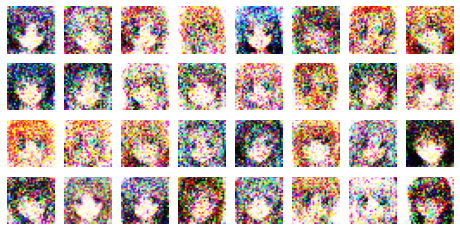

2000/1987 [==============================] - 69s 35ms/step - d loss: 0.6945 - g loss: 0.6933
Epoch 10/20: disc-loss = 0.6942747396383684, gen-loss = 0.6946595656133862


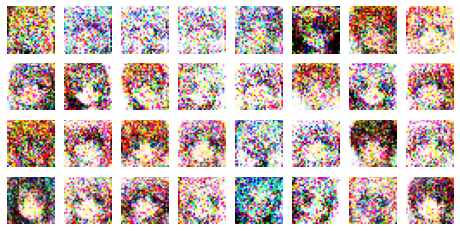

2000/1987 [==============================] - 71s 36ms/step - d loss: 0.6941 - g loss: 0.6941
Epoch 11/20: disc-loss = 0.6941148452442018, gen-loss = 0.6941281806660706


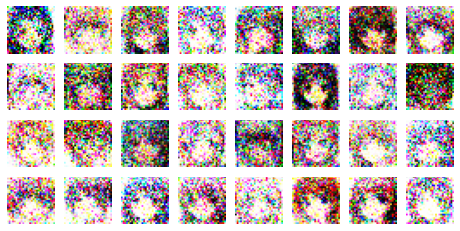

2000/1987 [==============================] - 71s 35ms/step - d loss: 0.6941 - g loss: 0.6940
Epoch 12/20: disc-loss = 0.6941340719867605, gen-loss = 0.6941525106401256


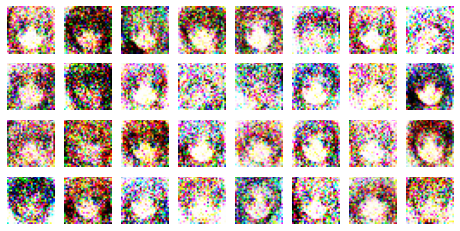

2000/1987 [==============================] - 70s 35ms/step - d loss: 0.6941 - g loss: 0.6949
Epoch 13/20: disc-loss = 0.6941215715998672, gen-loss = 0.6941745713480646


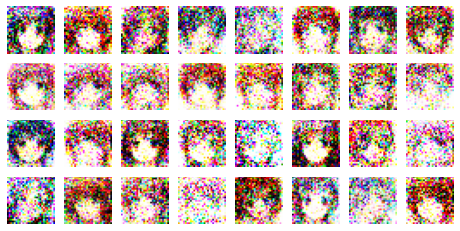

2000/1987 [==============================] - 67s 34ms/step - d loss: 0.6941 - g loss: 0.6942
Epoch 14/20: disc-loss = 0.6941173323807431, gen-loss = 0.6941440646889585


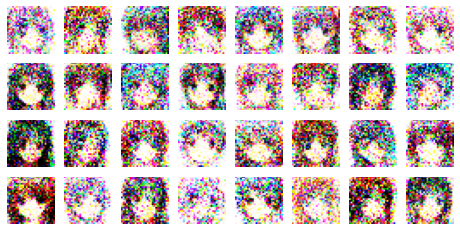

2000/1987 [==============================] - 66s 33ms/step - d loss: 0.6942 - g loss: 0.6946
Epoch 15/20: disc-loss = 0.6941212775062903, gen-loss = 0.694230065102186


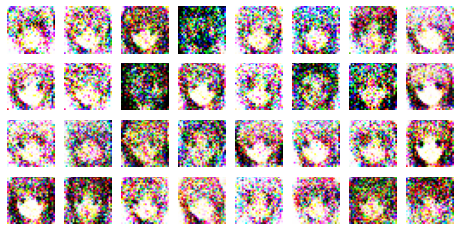

2000/1987 [==============================] - 69s 35ms/step - d loss: 0.6941 - g loss: 0.6941
Epoch 16/20: disc-loss = 0.694122405464948, gen-loss = 0.6941958409070849


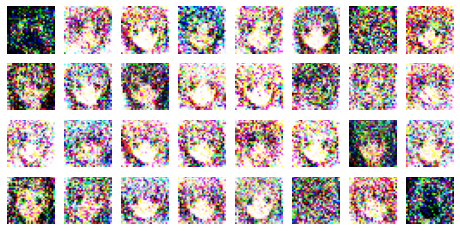

2000/1987 [==============================] - 71s 36ms/step - d loss: 0.6941 - g loss: 0.6948
Epoch 17/20: disc-loss = 0.694121462169699, gen-loss = 0.6941793783561753


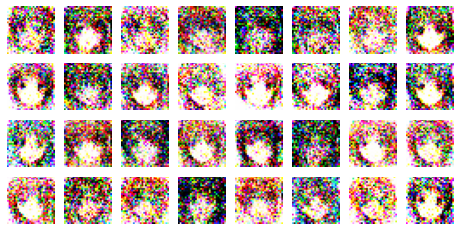

2000/1987 [==============================] - 67s 34ms/step - d loss: 0.6940 - g loss: 0.6965
Epoch 18/20: disc-loss = 0.69424102539745, gen-loss = 0.6948714908728002


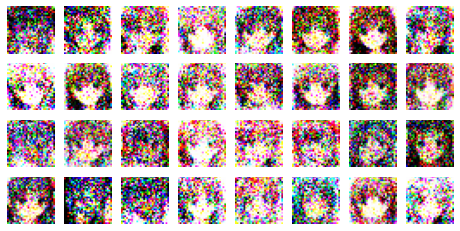

2000/1987 [==============================] - 67s 33ms/step - d loss: 0.6944 - g loss: 0.6960
Epoch 19/20: disc-loss = 0.694261248410498, gen-loss = 0.6946123859722769


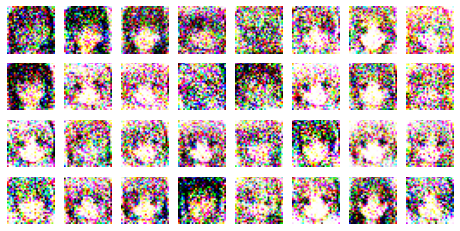

2000/1987 [==============================] - 70s 35ms/step - d loss: 0.6941 - g loss: 0.6993
Epoch 20/20: disc-loss = 0.6943471172855437, gen-loss = 0.6953703581716886


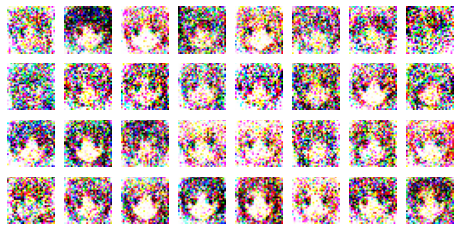

In [10]:
standard_GAN.train()

In [12]:
class DCGAN(GAN):
    def __init__(self, X= None, batch_size= 32, epochs= 10, optimizer= tf.keras.optimizers.Adam(0.01), noise_dim = 30):
        super(DCGAN, self).__init__(X, batch_size, epochs, optimizer, noise_dim)
    
    def build(self):
        self.generator = keras.models.Sequential([
            keras.layers.Dense(7 * 7 * 128, input_shape=[self.noise_dim]),
            keras.layers.Reshape([7, 7, 128]),
            keras.layers.BatchNormalization(),
            keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME", activation="selu"),
            keras.layers.BatchNormalization(),
            keras.layers.Conv2DTranspose(3, kernel_size=5, strides=2, padding="SAME", activation="tanh")])
        
        self.discriminator = keras.models.Sequential([keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME", activation=keras.layers.LeakyReLU(0.2), input_shape=[28, 28, 3]),
                                                      keras.layers.Dropout(0.4),
                                                      keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME", activation=keras.layers.LeakyReLU(0.2)),
                                                      keras.layers.Dropout(0.4),
                                                      keras.layers.Flatten(),
                                                      keras.layers.Dense(1, activation="sigmoid")])

        self.gan = keras.models.Sequential([self.generator, self.discriminator])
        
        self.discriminator.compile(loss="binary_crossentropy", optimizer= self.optimizer)
        self.discriminator.trainable = False
        self.gan.compile(loss="binary_crossentropy", optimizer= self.optimizer)

In [11]:
X_train_DC = np.array(X_train)

In [13]:
X_train_DC = X_train_DC.reshape([-3, 28, 28, 3])* 2. - 1. # scale input to (-1,1)

In [14]:
DC_GAN = DCGAN(X= X_train_DC, noise_dim=100, epochs= 20, optimizer= tf.keras.optimizers.RMSprop())

In [15]:
DC_GAN.build()

2000/1987 [==============================] - 635s 317ms/step - d loss: 0.6623 - g loss: 0.8992
Epoch 1/20: disc-loss = 0.6575100978505509, gen-loss = 0.9370298979398018


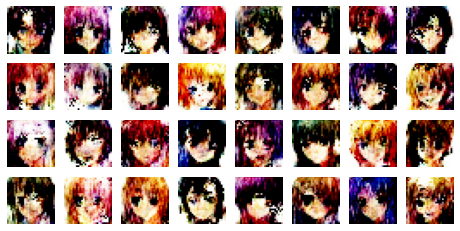

2000/1987 [==============================] - 640s 320ms/step - d loss: 0.6409 - g loss: 1.0890
Epoch 2/20: disc-loss = 0.6435303576909301, gen-loss = 1.083138620652442


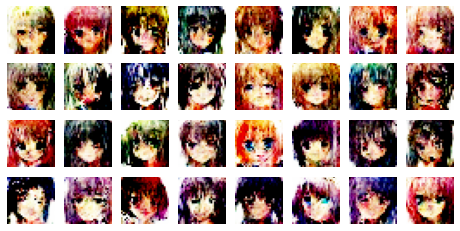

2000/1987 [==============================] - 632s 316ms/step - d loss: 0.6254 - g loss: 1.2164
Epoch 3/20: disc-loss = 0.6206336402839071, gen-loss = 1.2109428051283566


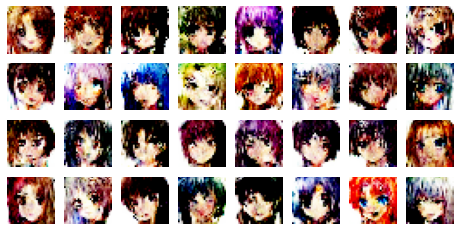

2000/1987 [==============================] - 632s 316ms/step - d loss: 0.6255 - g loss: 1.3189
Epoch 4/20: disc-loss = 0.6132967969881691, gen-loss = 1.298031987364591


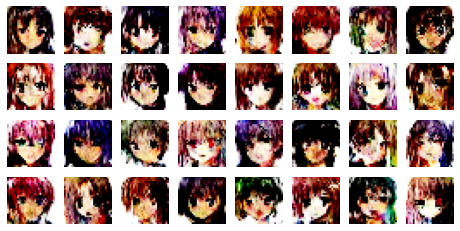

2000/1987 [==============================] - 635s 318ms/step - d loss: 0.5961 - g loss: 1.3468
Epoch 5/20: disc-loss = 0.5987131772595671, gen-loss = 1.3699795296429749


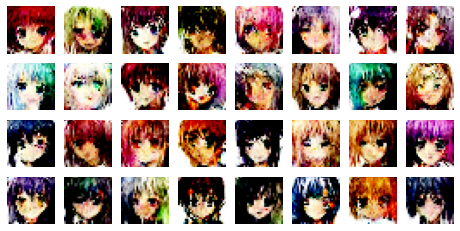

2000/1987 [==============================] - 635s 317ms/step - d loss: 0.5730 - g loss: 1.3480
Epoch 6/20: disc-loss = 0.5850884266756381, gen-loss = 1.4347065368308214


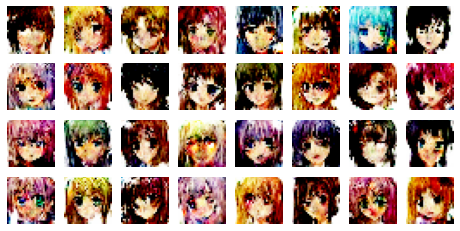

2000/1987 [==============================] - 645s 323ms/step - d loss: 0.5676 - g loss: 1.5375
Epoch 7/20: disc-loss = 0.5747810119831448, gen-loss = 1.4992855774903333


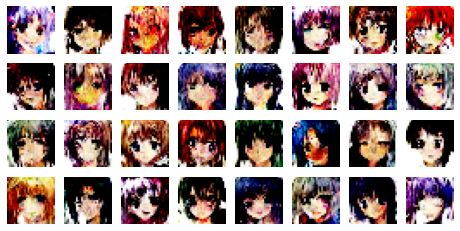

2000/1987 [==============================] - 639s 320ms/step - d loss: 0.5624 - g loss: 1.6102
Epoch 8/20: disc-loss = 0.5677194130978634, gen-loss = 1.5443321544438915


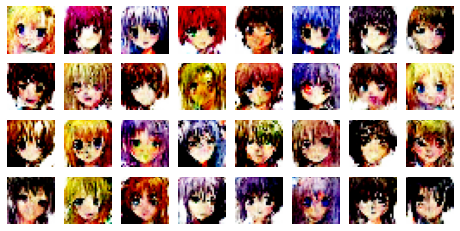

2000/1987 [==============================] - 630s 315ms/step - d loss: 0.5474 - g loss: 1.6665
Epoch 9/20: disc-loss = 0.565577694562193, gen-loss = 1.5721481037187888


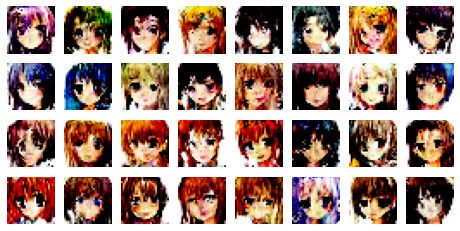

2000/1987 [==============================] - 634s 317ms/step - d loss: 0.5580 - g loss: 1.5784
Epoch 10/20: disc-loss = 0.5606094052369234, gen-loss = 1.5995561097756545


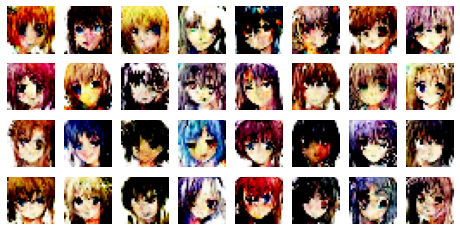

2000/1987 [==============================] - 635s 318ms/step - d loss: 0.5574 - g loss: 1.5670
Epoch 11/20: disc-loss = 0.5578905500145371, gen-loss = 1.6289132359523417


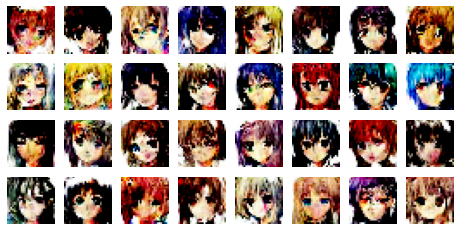

2000/1987 [==============================] - 620s 310ms/step - d loss: 0.5648 - g loss: 1.7281
Epoch 12/20: disc-loss = 0.5511105768963747, gen-loss = 1.638890311564401


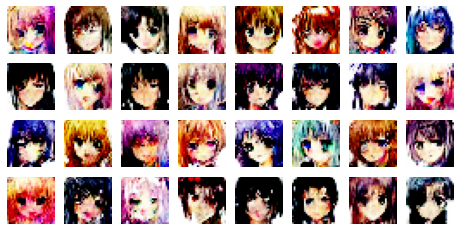

2000/1987 [==============================] - 616s 308ms/step - d loss: 0.5611 - g loss: 1.6241
Epoch 13/20: disc-loss = 0.5497691849547531, gen-loss = 1.6894656809119046


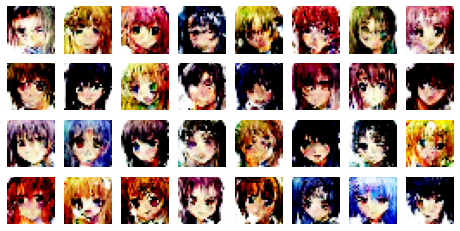

2000/1987 [==============================] - 618s 309ms/step - d loss: 0.5865 - g loss: 1.7207
Epoch 14/20: disc-loss = 0.5443657546200582, gen-loss = 1.7088101797507045


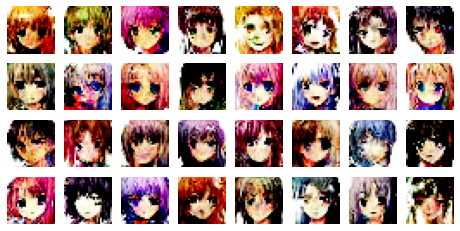

2000/1987 [==============================] - 609s 304ms/step - d loss: 0.5451 - g loss: 1.7698
Epoch 15/20: disc-loss = 0.5364852175903968, gen-loss = 1.7710943150652312


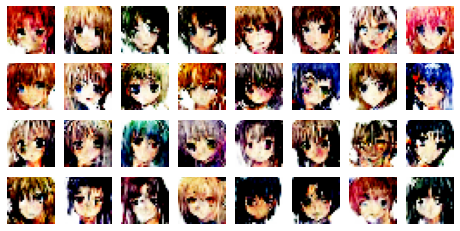

2000/1987 [==============================] - 619s 310ms/step - d loss: 0.5329 - g loss: 1.7168
Epoch 16/20: disc-loss = 0.5335114453837208, gen-loss = 1.7738018447301709


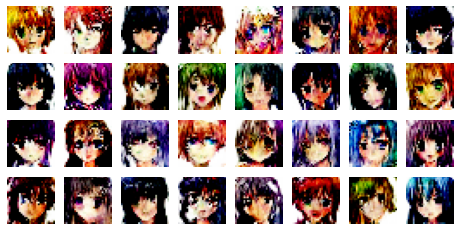

2000/1987 [==============================] - 625s 313ms/step - d loss: 0.5064 - g loss: 1.9135
Epoch 17/20: disc-loss = 0.5242755586964795, gen-loss = 1.829728110207345


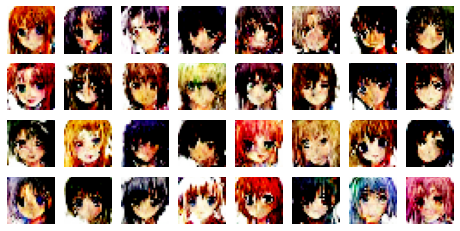

2000/1987 [==============================] - 635s 318ms/step - d loss: 0.5194 - g loss: 1.9514
Epoch 18/20: disc-loss = 0.5199993642044235, gen-loss = 1.878738682070268


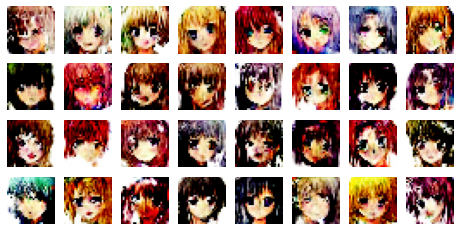

2000/1987 [==============================] - 617s 309ms/step - d loss: 0.5189 - g loss: 1.8968
Epoch 19/20: disc-loss = 0.5057689335082846, gen-loss = 1.9413346296197875


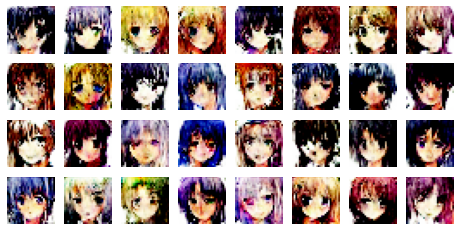

2000/1987 [==============================] - 614s 307ms/step - d loss: 0.4979 - g loss: 1.9292
Epoch 20/20: disc-loss = 0.5094320767178989, gen-loss = 1.9696389880381941


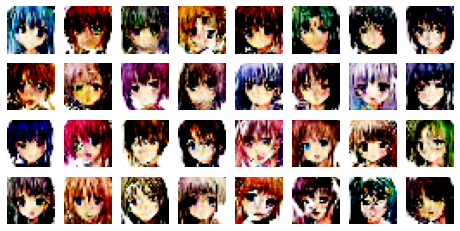

In [16]:
DC_GAN.train()